<a href="https://colab.research.google.com/github/Leomoi15/Regresi-n-No-Lineal/blob/main/Regresion_no_lienal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Actividad 6 (Regresión No Lineal)
##Leonardo Espinosa - A01351259

In [ ]:
#Cargamos librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.special as special
from scipy.optimize import curve_fit
import seaborn as sns
from sklearn.metrics import r2_score

In [ ]:
#Cargar archivo csv desde seaborn
data = pd.read_csv('cuentas_credicel.csv')
data.head()

<ipython-input-2-7f0fa77df2f9>:2: DtypeWarning: Columns (30) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('cuentas_credicel.csv')


,folio,tag,folio_solicitud,fecha,marca,modelo,plazo,precio,enganche,descuento,...,porc_eng,limite_credito,semana_actual,cp_cliente,edad_cliente,cd_cliente,edo_cliente,cd_venta,edo_venta,curp
0,3,HDNAWQ3A,30,12/11/2021 19:00,ZTE,Blade A3 2020 RO B,26S,1949.0,780.0,0.0,...,40.02,5000,26,NaN,23.0,0,0,Tantoyuca,Veracruz,AEVM980413MVZNDR02
1,4,M418YNR4,33,12/11/2021 19:15,MOTOROLA,LTE XT2097-12 E7I POWER Azul,13S,2999.0,1050.0,0.0,...,35.01,6000,13,NaN,60.0,PUEBLA,PUE.,Heroica Puebla de Zaragoza,Puebla,ZALC610119MPLPRR07
2,5,SZ7V3NZT,37,13/11/2021 14:13,ZTE,BLADE A3 2020 Gris,13S,1959.0,490.0,0.0,...,25.01,0,74,NaN,58.0,TANTOYUCA,VER.,0,0,0
3,6,9I08UIQZ,38,13/11/2021 15:45,ZTE,BLADE A3 2020 Gris,13S,1959.0,490.0,0.0,...,25.01,7000,13,NaN,42.0,AMXTLAN PUE,NaN,Zacatlan,Puebla,SAMJ790115MPLNRS02
4,7,JMF4LKYU,44,13/11/2021 16:10,MOTOROLA,G10 B,39S,4299.0,1075.0,0.0,...,25.01,7000,74,NaN,33.0,TANTOYUCA,VER.,Tantoyuca,Veracruz,TEHF880707HVZRRR07


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22735 entries, 0 to 22734
Data columns (total 39 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   folio               22735 non-null  int64  
 1   tag                 22735 non-null  object 
 2   folio_solicitud     22735 non-null  int64  
 3   fecha               22735 non-null  object 
 4   marca               22735 non-null  object 
 5   modelo              22735 non-null  object 
 6   plazo               22735 non-null  object 
 7   precio              22735 non-null  float64
 8   enganche            22735 non-null  float64
 9   descuento           22735 non-null  float64
 10  semana              22735 non-null  int64  
 11  monto_financiado    22735 non-null  float64
 12  costo_total         22735 non-null  int64  
 13  monto_accesorios    22735 non-null  float64
 14  agente_venta        22735 non-null  object 
 15  dis_venta           22735 non-null  object 
 16  stat

In [ ]:
#Corroboramos valores nulos en las columnas de nuestro dataframe
valores_nulos=data.isnull().sum()
valores_nulos

folio                    0
tag                      0
folio_solicitud          0
fecha                    0
marca                    0
modelo                   0
plazo                    0
precio                   0
enganche                 0
descuento                0
semana                   0
monto_financiado         0
costo_total              0
monto_accesorios         0
agente_venta             0
dis_venta                0
status                   0
fraude                   0
empresa                 13
inversion                0
pagos_realizados         0
reautorizacion           0
fecha_ultimo_pago     3356
fecha_pago_proximo    3356
status_cuenta         3314
puntos                   0
riesgo                   0
score_buro               0
razones_buro          7340
porc_eng                 0
limite_credito           0
semana_actual            0
cp_cliente            7243
edad_cliente             9
cd_cliente               0
edo_cliente              8
cd_venta                 0
e

##Limpieza de datos

In [ ]:
data[data.columns[data.isnull().sum() > 0]].isnull().sum()

empresa                 13
fecha_ultimo_pago     3356
fecha_pago_proximo    3356
status_cuenta         3314
razones_buro          7340
cp_cliente            7243
edad_cliente             9
edo_cliente              8
dtype: int64

In [ ]:
columna = ['empresa']
data[columna] = data[columna].fillna(method = 'ffill')

In [ ]:
columna = ['fecha_ultimo_pago', 'fecha_pago_proximo']
data[columna] = data[columna].fillna('01/01/1900 00:00')

In [ ]:
columna = ['status_cuenta']
data[columna] = data[columna].fillna('Corriente')

In [ ]:
columna = ['razones_buro', 'edo_cliente', 'cp_cliente']
data[columna] = data[columna].fillna(method = 'bfill')

In [ ]:
columna = ['edad_cliente']
data[columna] = data[columna].fillna(round(data[columna].mean(),0))

In [ ]:
data['limite_credito'] = pd.to_numeric(data['limite_credito'], errors='coerce')
data['limite_credito'].fillna(7000, inplace=True)

In [ ]:
data.isnull().sum()

folio                 0
tag                   0
folio_solicitud       0
fecha                 0
marca                 0
modelo                0
plazo                 0
precio                0
enganche              0
descuento             0
semana                0
monto_financiado      0
costo_total           0
monto_accesorios      0
agente_venta          0
dis_venta             0
status                0
fraude                0
empresa               0
inversion             0
pagos_realizados      0
reautorizacion        0
fecha_ultimo_pago     0
fecha_pago_proximo    0
status_cuenta         0
puntos                0
riesgo                0
score_buro            0
razones_buro          0
porc_eng              0
limite_credito        0
semana_actual         0
cp_cliente            0
edad_cliente          0
cd_cliente            0
edo_cliente           0
cd_venta              0
edo_venta             0
curp                  0
dtype: int64

##Valores atipicos

In [ ]:
data2 = data.copy()

<Figure size 3000x5000 with 0 Axes>

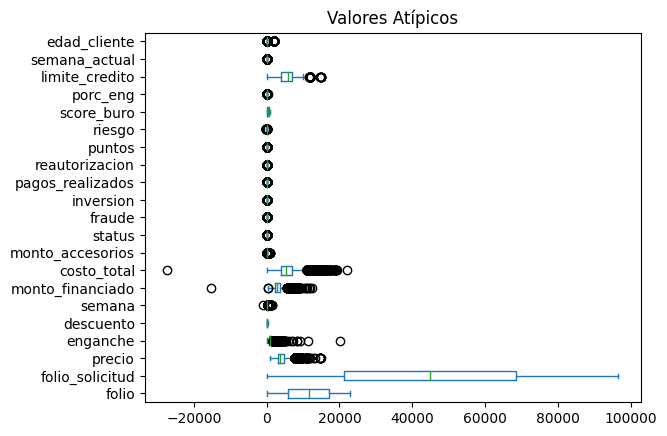

In [ ]:
#Realizamos diagrama de caja o bigote de cada columna del nuevo dataframe para poder observar los valores atipicos de cada dato numerico
import matplotlib.pyplot as plt
fig = plt.figure(figsize =(30, 50))
data2.plot(kind='box', vert=False)
plt.title("Valores Atípicos")
plt.show()

In [ ]:
#Seleccionamos solo las columnas númericas del df
datos_num = data2.select_dtypes(include=['number'])

#Definimos los limites con desviación estándar
y=datos_num
Limite_Superior= y.mean() + 3*y.std()
Limite_Inferior= y.mean() - 3*y.std()

#Eliminamos los outliers
y= y[(y<=Limite_Superior)&(y>=Limite_Inferior)]
y.isnull().sum()

folio                  0
folio_solicitud        0
precio               110
enganche             292
descuento             17
semana               362
monto_financiado     182
costo_total          290
monto_accesorios     617
status               154
fraude              1701
inversion              0
pagos_realizados     184
reautorizacion       774
puntos                 3
riesgo                65
score_buro             0
porc_eng             275
limite_credito         7
semana_actual        178
edad_cliente          99
dtype: int64

In [ ]:
#Sustiyuimos outliers con el promedio
y=y.fillna(round(y.mean(),1))
#Revisamos que se hayan imputado bien los outliers
y.isnull().sum()

folio               0
folio_solicitud     0
precio              0
enganche            0
descuento           0
semana              0
monto_financiado    0
costo_total         0
monto_accesorios    0
status              0
fraude              0
inversion           0
pagos_realizados    0
reautorizacion      0
puntos              0
riesgo              0
score_buro          0
porc_eng            0
limite_credito      0
semana_actual       0
edad_cliente        0
dtype: int64

In [ ]:
data2.describe()

,folio,folio_solicitud,precio,enganche,descuento,semana,monto_financiado,costo_total,monto_accesorios,status,...,inversion,pagos_realizados,reautorizacion,puntos,riesgo,score_buro,porc_eng,limite_credito,semana_actual,edad_cliente
count,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,...,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000
mean,11511.025951,45850.095711,3997.036591,926.437389,78.475742,237.747350,3076.136613,5699.692325,13.463768,1.255377,...,0.236596,10.180779,0.034044,14.156807,5.265978,289.953552,23.207056,5920.406862,20.611700,43.654893
std,6604.027249,27291.270417,1361.507164,476.686485,133.246426,101.180014,1096.727066,2385.965307,59.265704,0.451933,...,0.425001,9.708451,0.181347,11.399142,17.730115,284.022483,7.501417,2136.564751,14.589733,126.220157
min,3.000000,30.000000,973.240000,0.000000,0.000000,-1049.000000,-15150.000000,-27274.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,-15.000000,-64.000000,0.000000,0.000000,0.000000,0.000000,14.000000
25%,5818.500000,21214.500000,3049.000000,625.500000,0.000000,170.000000,2363.000000,4056.000000,0.000000,1.000000,...,0.000000,2.000000,0.000000,10.000000,-5.700000,0.000000,18.450000,4000.000000,11.000000,26.000000
50%,11520.000000,44938.000000,3549.000000,826.000000,0.000000,214.000000,2824.000000,5213.000000,0.000000,1.000000,...,0.000000,8.000000,0.000000,12.000000,2.250000,427.000000,22.910000,6000.000000,16.000000,34.000000
75%,17224.500000,68485.500000,4899.000000,1112.000000,200.000000,285.000000,3699.000000,6877.000000,0.000000,1.000000,...,0.000000,15.000000,0.000000,14.000000,20.700000,548.000000,25.800000,7000.000000,26.000000,43.000000
max,22971.000000,96536.000000,14900.000000,20150.000000,500.000000,1385.000000,12330.000000,22204.000000,853.000000,4.000000,...,1.000000,62.000000,1.000000,50.000000,103.000000,814.000000,403.000000,15000.000000,74.000000,1972.000000


In [ ]:
for columna in y.columns:
    data2[columna] = y[columna]
data2.describe()

,folio,folio_solicitud,precio,enganche,descuento,semana,monto_financiado,costo_total,monto_accesorios,status,...,inversion,pagos_realizados,reautorizacion,puntos,riesgo,score_buro,porc_eng,limite_credito,semana_actual,edad_cliente
count,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,...,22735.000000,22735.000000,22735.0,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000
mean,11511.025951,45850.095711,3969.204786,897.571531,78.160343,231.393130,3043.789505,5588.620101,5.009721,1.243053,...,0.236596,9.916895,0.0,14.152083,5.244405,289.953552,22.809138,5917.636824,20.237985,35.344874
std,6604.027249,27291.270417,1295.204963,370.539236,132.746538,86.084072,1020.864637,2152.608806,23.849845,0.427671,...,0.425001,9.252767,0.0,11.391702,17.398553,284.022483,6.083129,2130.724972,13.969485,11.904960
min,3.000000,30.000000,973.240000,0.000000,0.000000,7.000000,249.000000,91.000000,0.000000,1.000000,...,0.000000,0.000000,0.0,-15.000000,-47.000000,0.000000,2.750000,0.000000,0.000000,14.000000
25%,5818.500000,21214.500000,3049.000000,625.500000,0.000000,170.000000,2363.000000,4056.000000,0.000000,1.000000,...,0.000000,2.000000,0.0,10.000000,-5.500000,0.000000,18.450000,4000.000000,11.000000,26.000000
50%,11520.000000,44938.000000,3549.000000,826.000000,0.000000,214.000000,2824.000000,5213.000000,0.000000,1.000000,...,0.000000,8.000000,0.0,12.000000,2.400000,427.000000,22.800000,6000.000000,16.000000,34.000000
75%,17224.500000,68485.500000,4849.000000,1091.000000,200.000000,279.000000,3658.880000,6747.000000,0.000000,1.000000,...,0.000000,15.000000,0.0,14.000000,20.550000,548.000000,25.570000,7000.000000,26.000000,43.000000
max,22971.000000,96536.000000,8069.000000,2349.000000,400.000000,541.000000,6366.010000,12844.000000,190.000000,2.000000,...,1.000000,39.000000,0.0,48.000000,58.000000,814.000000,45.700000,12000.000000,64.000000,87.000000


##Regresion no lienal

In [ ]:
data4 = data2.copy()

In [ ]:
data4.describe()

,folio,folio_solicitud,precio,enganche,descuento,semana,monto_financiado,costo_total,monto_accesorios,status,...,inversion,pagos_realizados,reautorizacion,puntos,riesgo,score_buro,porc_eng,limite_credito,semana_actual,edad_cliente
count,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,...,22735.000000,22735.000000,22735.0,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000,22735.000000
mean,11511.025951,45850.095711,3969.204786,897.571531,78.160343,231.393130,3043.789505,5588.620101,5.009721,1.243053,...,0.236596,9.916895,0.0,14.152083,5.244405,289.953552,22.809138,5917.636824,20.237985,35.344874
std,6604.027249,27291.270417,1295.204963,370.539236,132.746538,86.084072,1020.864637,2152.608806,23.849845,0.427671,...,0.425001,9.252767,0.0,11.391702,17.398553,284.022483,6.083129,2130.724972,13.969485,11.904960
min,3.000000,30.000000,973.240000,0.000000,0.000000,7.000000,249.000000,91.000000,0.000000,1.000000,...,0.000000,0.000000,0.0,-15.000000,-47.000000,0.000000,2.750000,0.000000,0.000000,14.000000
25%,5818.500000,21214.500000,3049.000000,625.500000,0.000000,170.000000,2363.000000,4056.000000,0.000000,1.000000,...,0.000000,2.000000,0.0,10.000000,-5.500000,0.000000,18.450000,4000.000000,11.000000,26.000000
50%,11520.000000,44938.000000,3549.000000,826.000000,0.000000,214.000000,2824.000000,5213.000000,0.000000,1.000000,...,0.000000,8.000000,0.0,12.000000,2.400000,427.000000,22.800000,6000.000000,16.000000,34.000000
75%,17224.500000,68485.500000,4849.000000,1091.000000,200.000000,279.000000,3658.880000,6747.000000,0.000000,1.000000,...,0.000000,15.000000,0.0,14.000000,20.550000,548.000000,25.570000,7000.000000,26.000000,43.000000
max,22971.000000,96536.000000,8069.000000,2349.000000,400.000000,541.000000,6366.010000,12844.000000,190.000000,2.000000,...,1.000000,39.000000,0.0,48.000000,58.000000,814.000000,45.700000,12000.000000,64.000000,87.000000


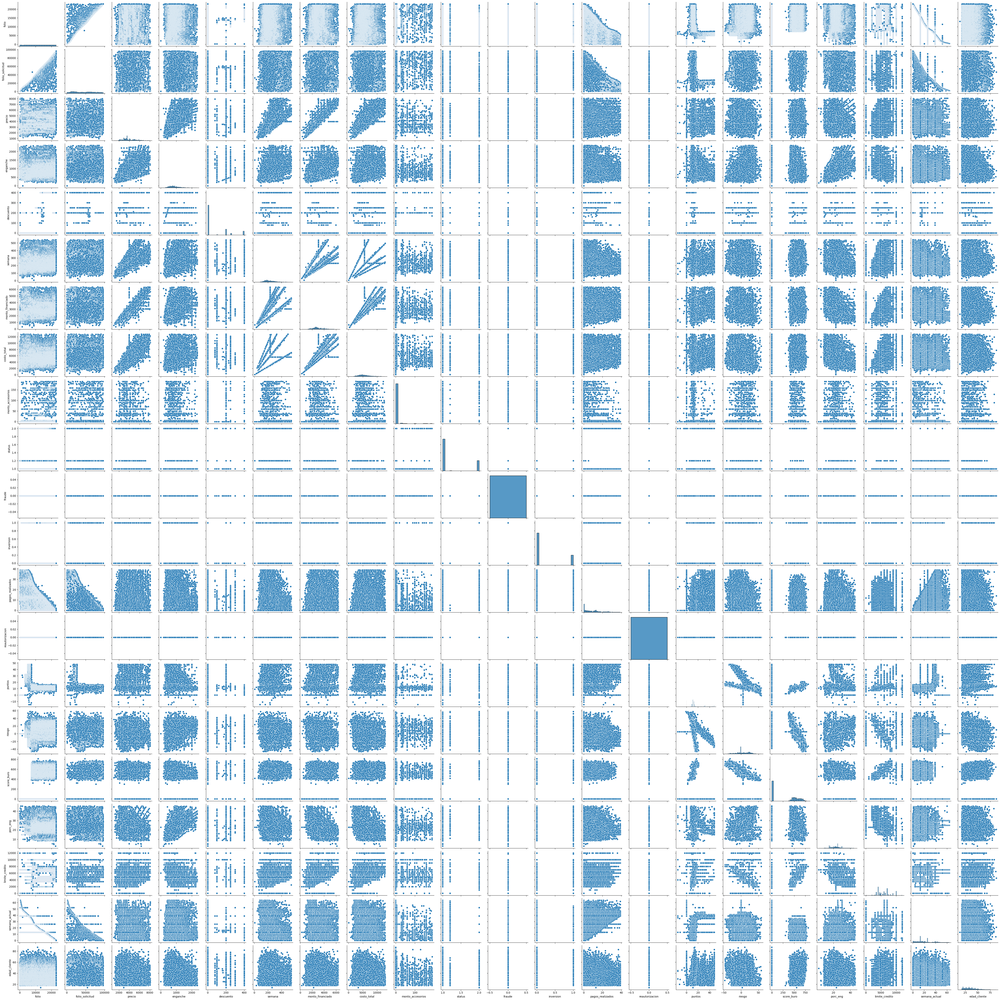

In [ ]:
#Graficamos todas las dispersiones entre todas las variables
sns.pairplot(data4)

In [402]:
coeficientes = pd.DataFrame(columns=['Variable', 'Modelo', 'Determinación', 'Correlación'])

##Modelos Variable "riesgo"

#Modelo 1 con funcion cuadratica

In [403]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
df = data4[data4['score_buro'] != 0]
Vars_Indep= df[['score_buro']]
Var_Dep= df['riesgo']

In [404]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [405]:
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [406]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df['score_buro'], df['riesgo'])

In [407]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 7.00078605e-05, -2.73654506e-01,  1.36598623e+02])

In [408]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df['score_buro'], df['riesgo'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*x**2 + b*x + c

In [409]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,score_buro
7235,-3.148711
7236,-13.880135
7239,-18.537876
7240,-19.246051
7241,-12.063493
...,...
22728,20.961657
22730,23.653659
22731,16.866322
22732,25.740531


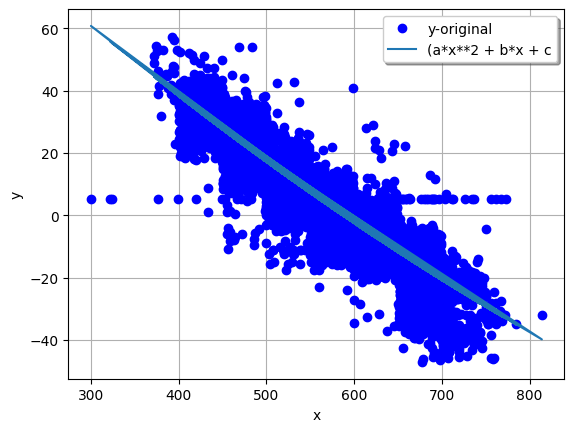

In [410]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [411]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.8396522294982887

In [412]:
corr= np.sqrt(abs(R2))
corr

0.916325394987113

In [413]:
coeficientes.loc[0] = ['Riesgo', 'Modelo 1', round(R2,2), round(corr,2)]

##Modelo 2 con funcion logaritmica

In [414]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df[['edad_cliente']]
Var_Dep= df['riesgo']

In [415]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [416]:
def  func1 (x, a, b):
     return a*np.log(x) + b


In [417]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df['edad_cliente'], df['riesgo'])

In [418]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-10.50654852,  44.09976776])

In [419]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df['edad_cliente'], df['riesgo'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.log(x) + b

In [420]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,edad_cliente
7235,13.731937
7236,8.020415
7239,1.807215
7240,10.280493
7241,6.745331
...,...
22728,5.342377
22730,11.623580
22731,9.471898
22732,6.449352


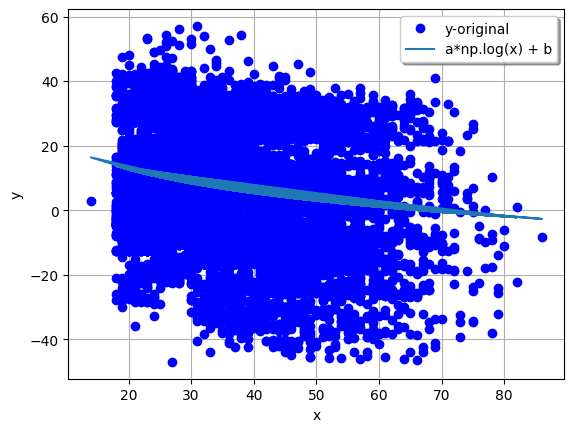

In [421]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.log(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [422]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.03343823748368624

In [423]:
corr= np.sqrt(abs(R2))
corr

0.18286125200185588

In [424]:
coeficientes.loc[1] = ['Riesgo', 'Modelo 2', round(R2,2), round(corr,2)]

##Modelo 3 con función cociente entre polinomios

In [425]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df[['puntos']]
Var_Dep= df['riesgo']

In [426]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [427]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [428]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df['puntos'], df['riesgo'])

In [429]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-0.50907672, 83.63958302, 20.89581916])

In [430]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df['puntos'], df['riesgo'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =(a*x**2 + b)/ c*x

In [431]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,puntos
7235,18.263908
7236,-22.183394
7239,-114.846998
7240,-51.647701
7241,-70.034246
...,...
22728,11.603005
22730,15.664335
22731,18.263908
22732,11.603005


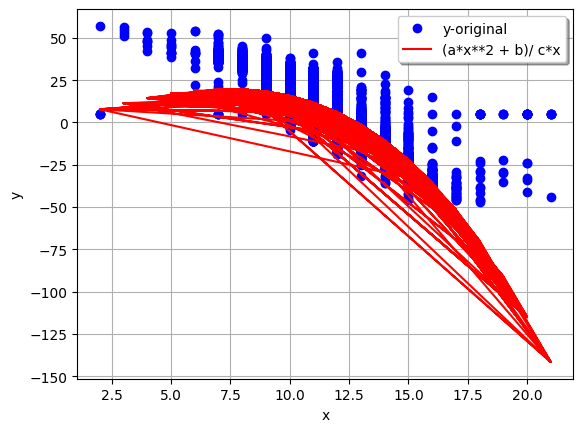

In [432]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [433]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.5109395835533621

In [434]:
corr= np.sqrt(abs(R2))
corr

0.7148003802134986

In [436]:
coeficientes.loc[2] = ['Riesgo', 'Modelo 3', round(R2,2), round(corr,2)]

##Modelo 4 con función cuadrática inversa

In [437]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df[['enganche']]
Var_Dep= df['riesgo']

In [438]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [439]:
def  func1 (x, a):
     return 1/a*x**2

In [440]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df['enganche'], df['riesgo'])

In [441]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([156208.69306849])

In [442]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df['enganche'], df['riesgo'])
a = parametros[ 0 ]
yfit1 = 1/a*x**2

In [443]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,enganche
7235,4.980030
7236,4.442064
7239,1.024271
7240,1.211360
7241,4.856586
...,...
22728,0.802234
22730,0.564687
22731,9.357232
22732,8.495712


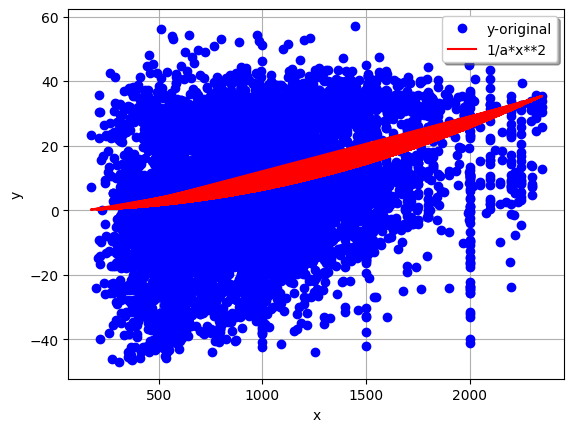

In [444]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x**2", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [445]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.07343750537808125

In [446]:
corr= np.sqrt(abs(R2))
corr

0.2709935522813804

In [447]:
coeficientes.loc[3] = ['Riesgo', 'Modelo 4', round(R2,2), round(corr,2)]

##Modelo 5 con función tangencial

In [448]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df[['monto_financiado']]
Var_Dep= df['riesgo']

In [449]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [450]:
def  func1 (x, a, b):
     return a*np.tan(x) + b

In [451]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df['monto_financiado'], df['riesgo'])

In [452]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-6.71474979e-04,  6.79958986e+00])

In [453]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df['monto_financiado'], df['riesgo'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.tan(x) + b

In [454]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,monto_financiado
7235,6.799004
7236,6.799876
7239,6.799204
7240,6.798012
7241,6.799348
...,...
22728,6.799407
22730,6.787877
22731,6.798983
22732,6.800105


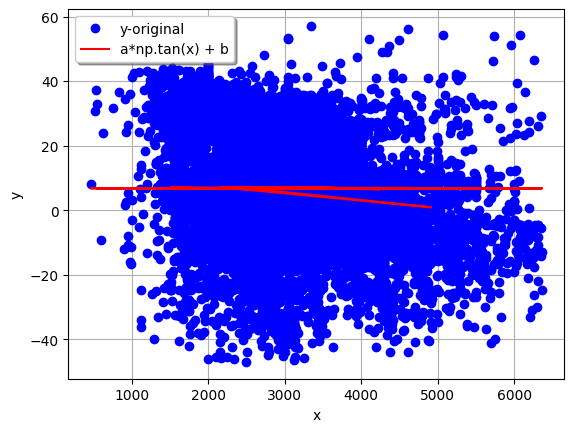

In [455]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [456]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

9.602360005578348e-06

In [457]:
corr= np.sqrt(abs(R2))
corr

0.0030987674978252802

In [458]:
coeficientes.loc[4] = ['Riesgo', 'Modelo 5', round(R2,2), round(corr,2)]

##Modelos Variable "score_buro"

##Modelo 6 con funcion polinomial inversa

In [459]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
df1 = df[df['score_buro'] != 0]
Vars_Indep= df1[['puntos']]
Var_Dep= df1['score_buro']

In [460]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [461]:
def  func1 (x, a, b, c):
     return a/b*x**2 + c*x

In [462]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['puntos'], df1['score_buro'])

In [463]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-94.83428095,  77.83471776,  62.76507948])

In [464]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['puntos'], df1['score_buro'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a/b*x**2 + c*x

In [465]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,puntos
7235,466.194836
7236,667.334860
7239,767.939221
7240,714.887040
7241,735.007912
...,...
22728,542.988758
22730,505.810203
22731,466.194836
22732,542.988758


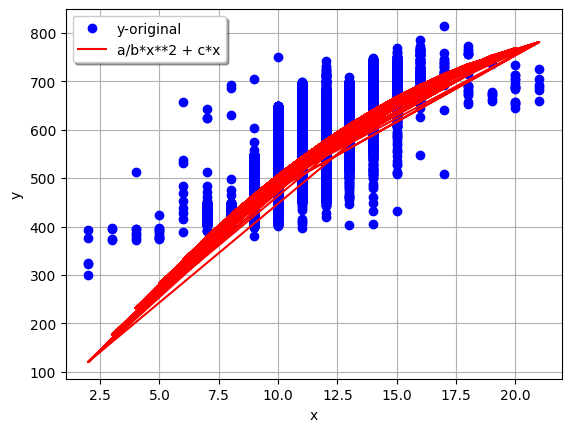

In [466]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a/b*x**2 + c*x", c='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [467]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.5080482648108805

In [468]:
corr= np.sqrt(abs(R2))
corr

0.7127750450253435

In [470]:
coeficientes.loc[5] = ['Score_buro', 'Modelo 6', round(R2,2), round(corr,2)]

### Modelo 7 con funcion logaritmica

In [471]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df1[['edad_cliente']]
Var_Dep= df1['score_buro']

In [472]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [473]:
def  func1 (x, a, b):
     return a*np.log(x) + b

In [474]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['edad_cliente'], df1['score_buro'])

In [475]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 10.15819457, 518.9199497 ])

In [476]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['edad_cliente'], df1['score_buro'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.log(x) + b

In [477]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,edad_cliente
7235,548.280908
7236,553.803060
7239,559.810255
7240,551.617917
7241,555.035867
...,...
22728,556.392305
22730,550.319360
22731,552.399702
22732,555.322032


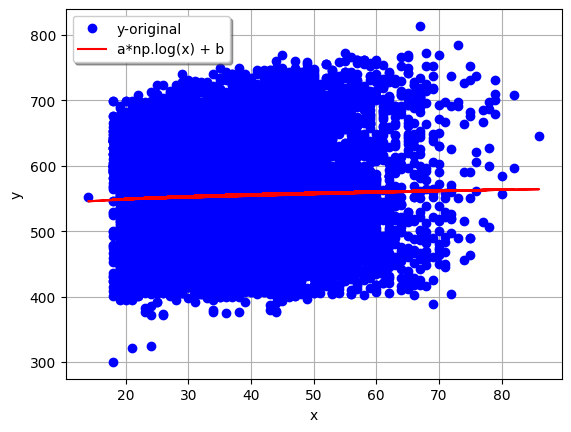

In [478]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.log(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [479]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.001408634342629167

In [480]:
corr= np.sqrt(abs(R2))
corr

0.037531777770699416

In [481]:
coeficientes.loc[7] = ['Score_buro', 'Modelo 7', round(R2,2), round(corr,2)]

##Modelo 8 con funcion cociente entre polinomios

In [482]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df1[['puntos']]
Var_Dep= df1['score_buro']

In [483]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [484]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [485]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['puntos'], df1['score_buro'])

In [486]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-3.57245258e+01,  4.22229882e+04,  7.67469280e+02])

In [487]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['puntos'], df1['score_buro'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =(a*x**2 + b)/ c*x

In [488]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,puntos
7235,461.208968
7236,668.136905
7239,727.929538
7240,706.577083
7241,718.814900
...,...
22728,543.218520
22730,503.610199
22731,461.208968
22732,543.218520


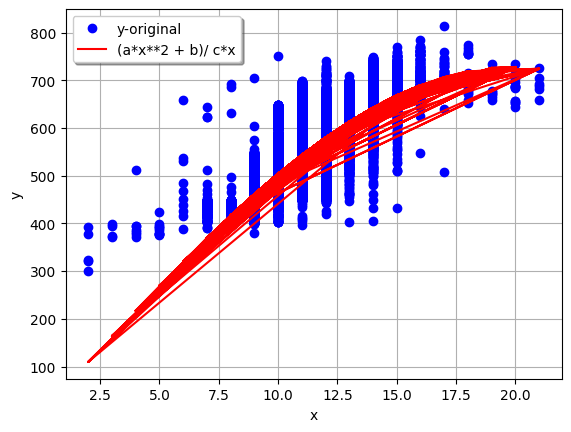

In [489]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [490]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.5039035426001423

In [491]:
corr= np.sqrt(abs(R2))
corr

0.7098616362363459

In [492]:
coeficientes.loc[8] = ['Score_buro', 'Modelo 8', round(R2,2), round(corr,2)]

##Modelo 9 con funcion cuadratica

In [501]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df1[['enganche']]
Var_Dep= df1['score_buro']

In [502]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [503]:
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [504]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['enganche'], df1['score_buro'])

In [505]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 4.67821040e-05, -1.69464638e-01,  6.66628566e+02])

In [506]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['enganche'], df1['score_buro'])
a, b ,c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*x**2 + b*x + c

In [507]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,enganche
7235,553.553676
7236,557.926109
7239,606.327847
7240,601.763791
7241,554.515688
...,...
22728,612.500630
22730,620.424171
22731,530.126330
22732,533.490019


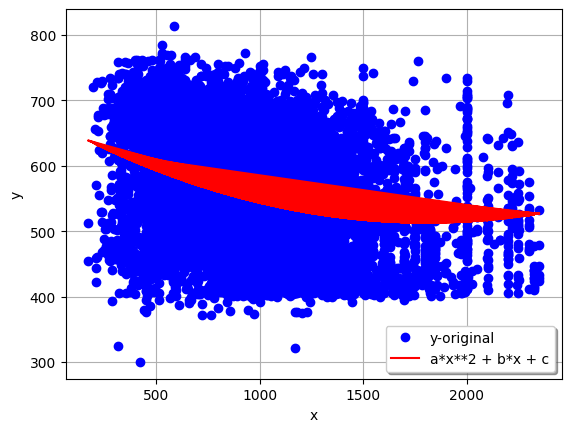

In [508]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x**2 + b*x + c", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [509]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.08932803164729286

In [510]:
corr= np.sqrt(abs(R2))
corr

0.2988779544350718

In [511]:
coeficientes.loc[9] = ['Score_buro', 'Modelo 9', round(R2,2), round(corr,2)]

##Modelo 10 funcion tangencial

In [569]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df1[['monto_financiado']]
Var_Dep= df1['score_buro']

In [570]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [571]:
def  func1 (x, a, b):
     return a*np.tan(x) + b

In [572]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df1['monto_financiado'], df1['score_buro'])

In [573]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([1.41524629e-03, 5.54983299e+02])

In [574]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df1['monto_financiado'], df1['score_buro'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.tan(x) + b

In [575]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,monto_financiado
7235,554.984533
7236,554.982695
7239,554.984112
7240,554.986624
7241,554.983808
...,...
22728,554.983684
22730,555.007987
22731,554.984577
22732,554.982213


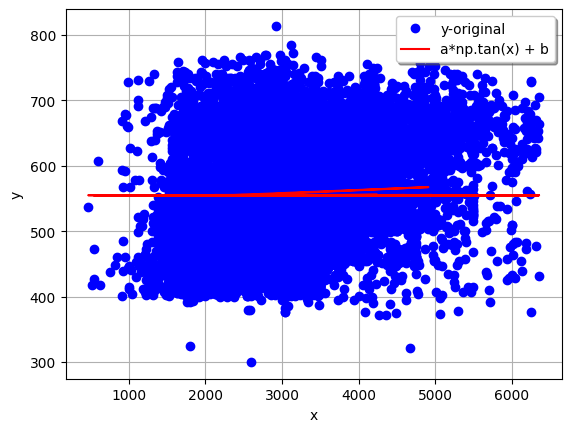

In [576]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [577]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

1.922263867193408e-06

In [578]:
corr= np.sqrt(abs(R2))
corr

0.0013864573081034295

In [579]:
coeficientes.loc[10] = ['Score_buro', 'Modelo 10', round(R2,2), round(corr,2)]

##Modelos Variable "porc_eng"

##Modelo 11 Funcion de valor absoluto

In [580]:
##Declaramos las variables dependientes e independientes para la regresión No lineal
df2 = df[df['enganche'] != 0]
Vars_Indep= df2[['enganche']]
Var_Dep= df2['porc_eng']

In [581]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [582]:
def  func1 (x, a, b, c):
     return a*np.abs(x) + b*x + c

In [583]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df2['enganche'], df2['porc_eng'])

In [584]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([100.00497468, -99.99507468,  14.14098495])

In [585]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df2['enganche'], df2['porc_eng'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*np.abs(x) + b*x + c

In [586]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,enganche
7235,22.872783
7236,22.387683
7239,18.100984
7240,18.447484
7241,22.763883
...,...
22728,17.645584
22730,17.081284
22731,26.110082
22732,25.545782


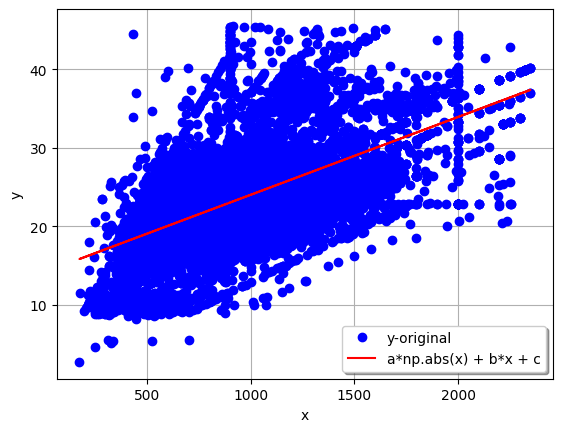

In [587]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.abs(x) + b*x + c", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [588]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.3315628289309668

In [589]:
corr= np.sqrt(abs(R2))
corr

0.5758149259362481

In [590]:
coeficientes.loc[11] = ['Porc_eng', 'Modelo 11', round(R2,2), round(corr,2)]

##Modelo 12 funcion logaritmica

In [591]:
##Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df2[['edad_cliente']]
Var_Dep= df2['porc_eng']

In [592]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [593]:
def  func1 (x, a, b):
     return a*np.log(x) + b

In [594]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df2['edad_cliente'], df2['porc_eng'])

In [595]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-1.29451547, 28.02761988])

In [596]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df2['edad_cliente'], df2['porc_eng'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.log(x) + b

In [597]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,edad_cliente
7235,24.285989
7236,23.582270
7239,22.816740
7240,23.860735
7241,23.425167
...,...
22728,23.252308
22730,24.026218
22731,23.761108
22732,23.388699


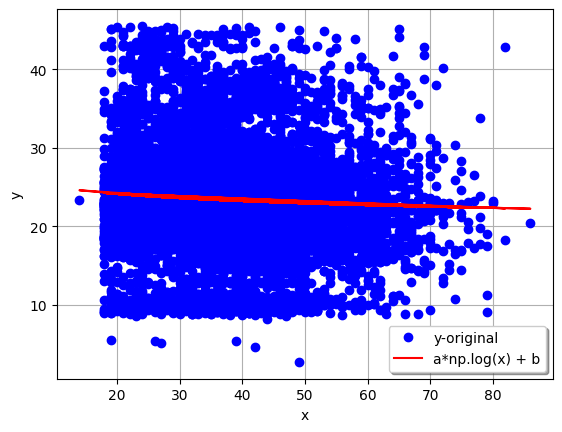

In [598]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.log(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [599]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.004274953775549317

In [600]:
corr= np.sqrt(abs(R2))
corr

0.06538313066494535

In [601]:
coeficientes.loc[12] = ['Porc_eng', 'Modelo 12', round(R2,2), round(corr,2)]

##Modelo 13 función cuadratica

In [602]:
##Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df2[['puntos']]
Var_Dep= df2['porc_eng']

In [603]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [604]:
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [605]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df2['puntos'], df2['porc_eng'])

In [606]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 7.86752734e-03, -1.84374217e+00,  4.34799391e+01])

In [607]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df2['puntos'], df2['porc_eng'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =a*x**2 + b*x + c

In [608]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,puntos
7235,27.523529
7236,17.594000
7239,9.752107
7240,14.410038
7241,12.841659
...,...
22728,24.150746
22730,25.829270
22731,27.523529
22732,24.150746


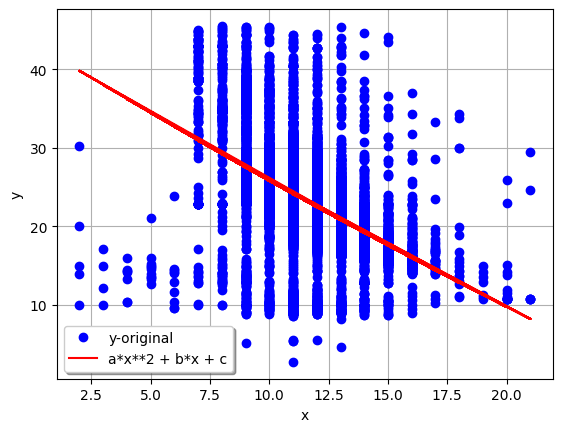

In [609]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x**2 + b*x + c", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [610]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.24364772582890937

In [611]:
corr= np.sqrt(abs(R2))
corr

0.4936068535068262

In [612]:
coeficientes.loc[13] = ['Porc_eng', 'Modelo 13', round(R2,2), round(corr,2)]

##Modelo 14 funcion cociente entre polinomios

In [613]:
##Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df2[['enganche']]
Var_Dep= df2['porc_eng']

In [614]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [615]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [616]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df2['enganche'], df2['porc_eng'])

In [617]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-2.36256095e-08,  1.84437621e-01,  6.27658465e+00])

In [618]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df2['enganche'], df2['porc_eng'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = (a*x**2 + b)/ c*x

In [619]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,enganche
7235,23.334946
7236,22.302051
7239,11.513110
7240,12.472655
7241,23.107141
...,...
22728,10.235318
22730,8.628742
22731,28.874710
22732,28.096928


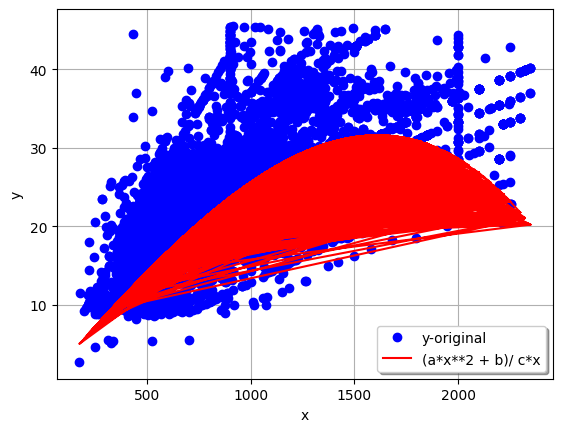

In [620]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [621]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.1848308869869405

In [622]:
corr= np.sqrt(abs(R2))
corr

0.4299196285201927

In [623]:
coeficientes.loc[14] = ['Porc_eng', 'Modelo 14', round(R2,2), round(corr,2)]

##Modelo 15 funcion tangencial

In [624]:
##Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df2[['monto_financiado']]
Var_Dep= df2['porc_eng']

In [625]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [626]:
def  func1 (x, a, b):
     return a*np.tan(x) + b

In [627]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df2['monto_financiado'], df2['porc_eng'])

In [628]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-1.10583672e-04,  2.34318560e+01])

In [629]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df2['monto_financiado'], df2['porc_eng'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.tan(x) + b

In [630]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,monto_financiado
7235,23.431760
7236,23.431903
7239,23.431792
7240,23.431596
7241,23.431816
...,...
22728,23.431826
22730,23.429927
22731,23.431756
22732,23.431941


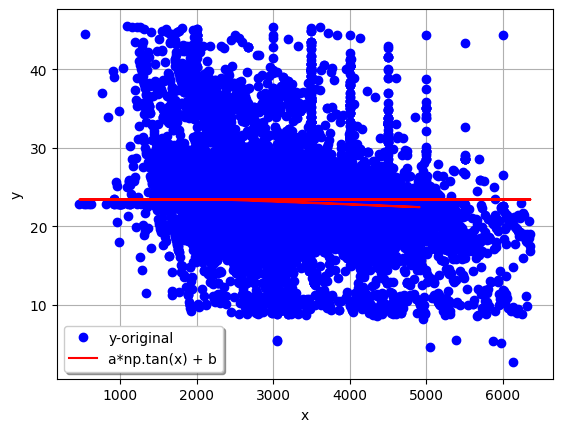

In [631]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [632]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

2.1934702559844865e-06

In [633]:
corr= np.sqrt(abs(R2))
corr

0.0014810368854233464

In [634]:
coeficientes.loc[15] = ['limite_credito', 'Modelo 15', round(R2,2), round(corr,2)]

##Modelos Variable "limite_credito"

##Modelo 16 funcion de valor absoluto

In [635]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
df3 = df[df['score_buro'] != 0]
Vars_Indep= df3[['score_buro']]
Var_Dep= df3['limite_credito']

In [636]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [637]:
def  func1 (x, a, b, c):
     return a*np.abs(x) + b*x + c

In [181]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df3['score_buro'], df3['limite_credito'])

In [638]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-1.10583672e-04,  2.34318560e+01])

In [639]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df3['score_buro'], df3['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a*np.abs(x) + b*x + c

In [640]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,score_buro
7235,6057.646391
7236,6803.200353
7239,7137.414198
7240,7188.831712
7241,6674.656566
...,...
22728,4489.412195
22730,4322.305273
22731,4746.499768
22732,4193.761486


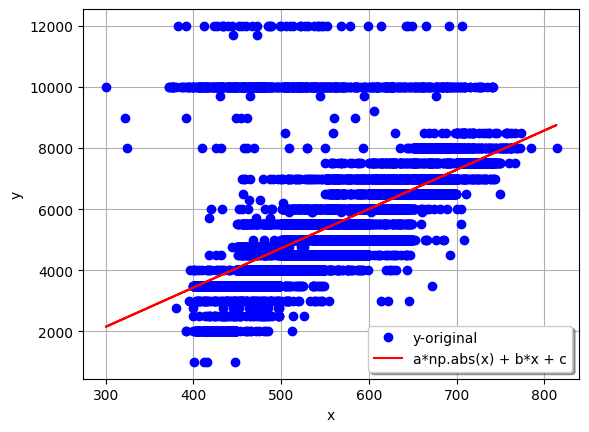

In [641]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.abs(x) + b*x + c", c = 'red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [642]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.36352003713290026

In [644]:
corr= np.sqrt(abs(R2))
corr

0.6029262285992377

In [645]:
coeficientes.loc[16] = ['limite_credito', 'Modelo 16', round(R2,2), round(corr,2)]

##Modelo 17 funcion logaritmica

In [646]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df3[['edad_cliente']]
Var_Dep= df3['limite_credito']

In [647]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [648]:
def  func1 (x, a, b):
     return a*np.log(x) + b

In [649]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df3['edad_cliente'], df3['limite_credito'])

In [650]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 848.88485942, 2413.86480985])

In [651]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df3['edad_cliente'], df3['limite_credito'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.log(x) + b

In [652]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,edad_cliente
7235,4867.457633
7236,5328.924555
7239,5830.924914
7240,5146.319762
7241,5431.945949
...,...
22728,5545.298727
22730,5037.803948
22731,5211.650825
22732,5455.859780


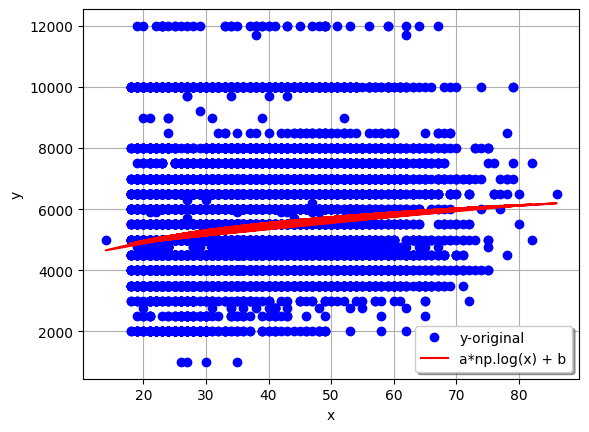

In [653]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.log(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [654]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.02164157124002697

In [655]:
corr= np.sqrt(abs(R2))
corr

0.14711074481500994

In [656]:
coeficientes.loc[17] = ['limite_credito', 'Modelo 17', round(R2,2), round(corr,2)]

##Modelo 18 función cuadratica

In [657]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df3[['puntos']]
Var_Dep= df3['limite_credito']

In [658]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [659]:
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [660]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df3['puntos'], df3['limite_credito'])

In [661]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([  32.2161527 , -223.00804331, 3647.18951545])

In [662]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df3['puntos'], df3['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =a*x**2 + b*x + c

In [663]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,puntos
7235,4249.625494
7236,7550.703222
7239,12073.489727
7240,9166.520908
7241,10071.078209
...,...
22728,5092.255515
22730,4638.724352
22731,4249.625494
22732,5092.255515


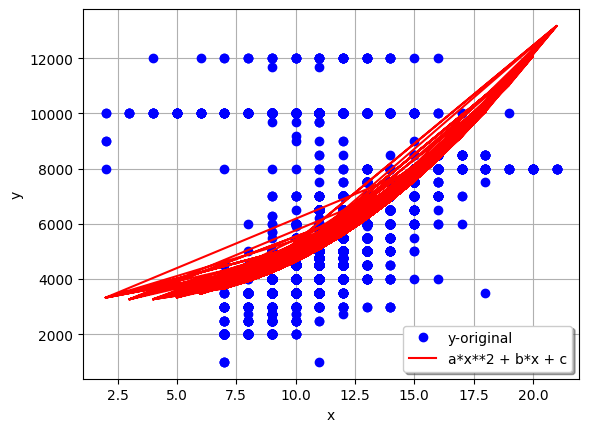

In [664]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*x**2 + b*x + c", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [665]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

0.3075750141855573

In [666]:
corr= np.sqrt(abs(R2))
corr

0.5545944592092111

In [667]:
coeficientes.loc[18] = ['limite_credito', 'Modelo 18', round(R2,2), round(corr,2)]

##Modelo 19 funcion cociente entre polinomios

In [668]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df3[['enganche']]
Var_Dep= df3['limite_credito']

In [669]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [670]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [671]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df3['enganche'], df3['limite_credito'])

In [672]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([-4.41091915e-05,  2.10336008e+02,  2.84911228e+01])

In [673]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df3['enganche'], df3['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = (a*x**2 + b)/ c*x

In [674]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,enganche
7235,5449.127628
7236,5254.772224
7239,2853.921034
7240,3083.957393
7241,5407.170318
...,...
22728,2544.728796
22730,2152.046403
22731,6189.566183
22732,6137.767878


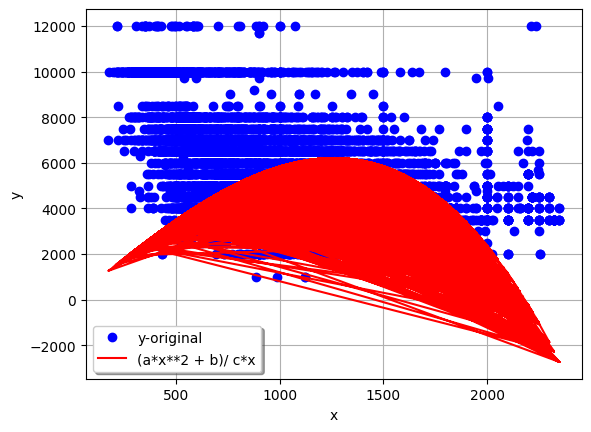

In [675]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [676]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

-0.931199334347409

In [677]:
corr= np.sqrt(abs(R2))
corr

0.9649867016427786

In [678]:
coeficientes.loc[19] = ['limite_credito', 'Modelo 19', round(R2,2), round(corr,2)]

##Modelo 20 funcion tangencial

In [679]:
#Declaramos las variables dependientes e independientes para la regresión No lineal}
Vars_Indep= df3[['monto_financiado']]
Var_Dep= df3['limite_credito']

In [680]:
#Redefinimos las variables
x= Vars_Indep
y= Var_Dep

In [681]:
def  func1 (x, a, b):
     return a*np.tan(x) + b

In [682]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df3['monto_financiado'], df3['limite_credito'])

In [683]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([1.07844145e-01, 5.42755447e+03])

In [684]:
#Creamos el modelo de predicción con los parámetros obtenidos
parametros, _ = curve_fit(func1, df3['monto_financiado'], df3['limite_credito'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.tan(x) + b

In [685]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,monto_financiado
7235,5427.648518
7236,5427.508455
7239,5427.616435
7240,5427.807884
7241,5427.593301
...,...
22728,5427.583823
22730,5429.435724
22731,5427.651909
22732,5427.471708


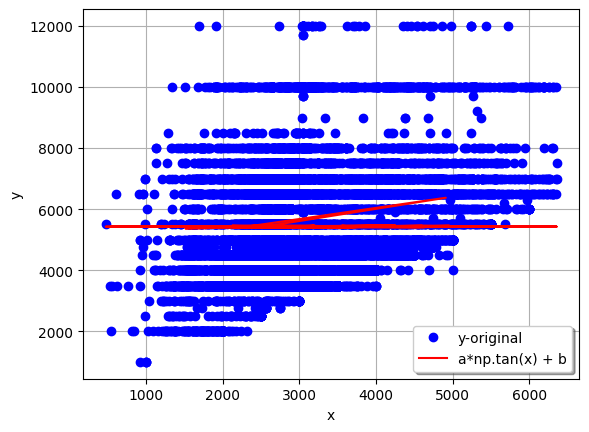

In [686]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b", c ='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [687]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1)
R2

2.455750799656986e-05

In [688]:
corr= np.sqrt(abs(R2))
corr

0.004955553248283168

In [689]:
coeficientes.loc[20] = ['limite_credito', 'Modelo 20', round(R2,2), round(corr,2)]

##Tabla de todos los coeficientes de determinación

In [690]:
coeficientes

,Variable,Modelo,Determinación,Correlación
0,Riesgo,Modelo 1,0.84,0.92
1,Riesgo,Modelo 2,0.03,0.18
2,Riesgo,Modelo 3,0.51,0.71
3,Riesgo,Modelo 4,0.07,0.27
4,Riesgo,Modelo 5,0.00,0.00
5,Score_buro,Modelo 6,0.51,0.71
7,Score_buro,Modelo 7,0.00,0.04
8,Score_buro,Modelo 8,0.50,0.71
9,Score_buro,Modelo 10,0.00,0.00
10,Score_buro,Modelo 10,0.00,0.00
